WAV file loaded from local path: C:\Users\egorp\Nextcloud\code\audiospylt_beta\source_audio\bongo.wav
Number of audio channels: 1
Sampling rate: 44100 Hz
WAV file loaded from source_audio/bongo.wav
Total duration: 1.689 seconds


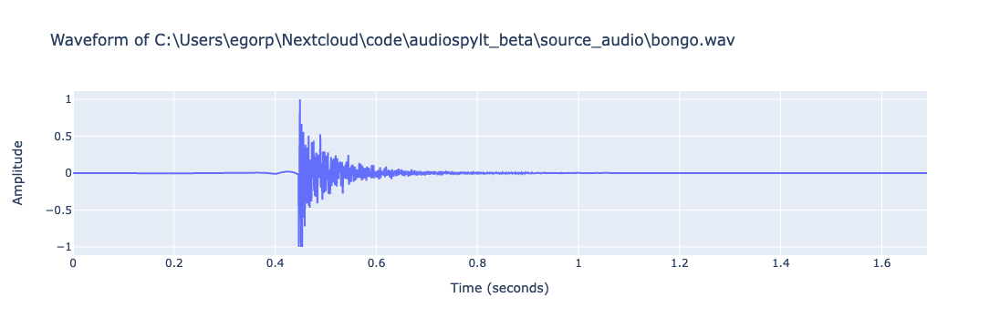

In [4]:
from IPython.display import Audio, display
from py_scripts.audio_utils import load_wav_from_source, load_audio_data, display_audio_properties, plot_waveform

# Adjustable variables
wav_source = 'source_audio/bongo.wav'
desired_sample_rate = None
convert_to_mono = True

# Load WAV and audio data
wav_filename = load_wav_from_source(wav_source)
audio_data, sample_rate = load_audio_data(wav_filename, desired_sample_rate, convert_to_mono)

# Display audio properties
num_channels = display_audio_properties(audio_data, sample_rate, wav_source)
# Plot waveform and get duration
duration = plot_waveform(audio_data, sample_rate, wav_filename)

# If the audio data is multi-channel, select the first channel to display
if num_channels > 1:
    audio_data = audio_data[:, 0]

# Create an audio player for the loaded file
display(Audio(audio_data, rate=sample_rate))

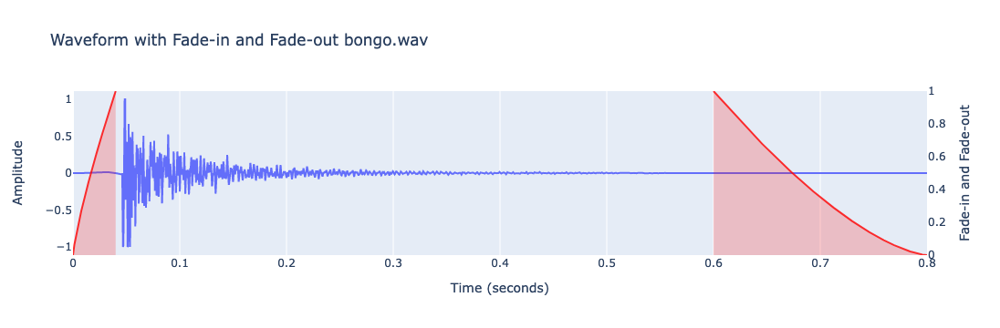

In [5]:
from py_scripts.audio_utils import trim_and_fade_audio

start_time = 0.4
end_time = 1.2
add_fades = True
fade_in_duration = 0.04
fade_out_duration = 0.2
fade_in_exponent = 0.8
fade_out_exponent = 1.5

cut_audio_data, cut_duration = trim_and_fade_audio(audio_data, sample_rate, num_channels, duration, wav_filename, start_time, 
                                                   end_time, add_fades, fade_in_duration, fade_out_duration, 
                                                   fade_in_exponent, fade_out_exponent)

# Create an audio player for the loaded file
display(Audio(cut_audio_data, rate=sample_rate))

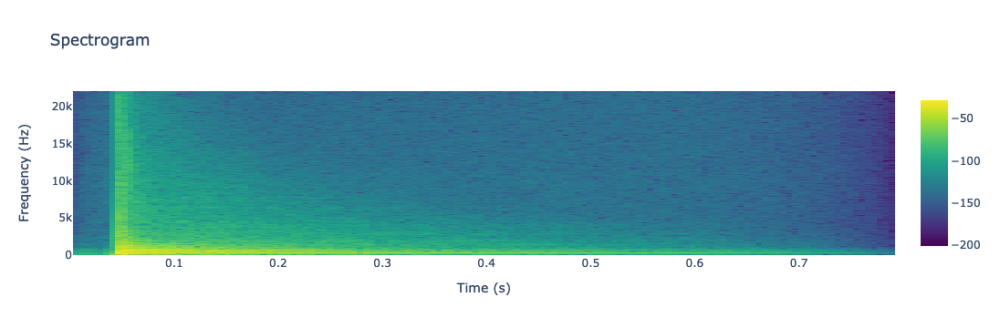

In [6]:
import numpy as np
import plotly.graph_objects as go
from scipy.signal import spectrogram

# Compute the spectrogram data
frequencies, times, Sxx = spectrogram(cut_audio_data, fs=sample_rate, nperseg=512, noverlap=256)

# Convert the amplitude spectrogram to dB scale
Sxx_dB = 10 * np.log10(Sxx)

# Display the spectrogram using Plotly
fig = go.Figure(data=go.Heatmap(z=Sxx_dB, x=times, y=frequencies, colorscale='Viridis', zmin=np.min(Sxx_dB), zmax=np.max(Sxx_dB)))
fig.update_layout(title="Spectrogram",
                  xaxis_title="Time (s)",
                  yaxis_title="Frequency (Hz)")

fig.show()


Analyzing chunk from 0.03s to 0.1s:
File name: chunk_0.03-0.1
Duration (s): 0.07
Sampling rate (Hz): 44100

Maximum amplitude value: 0.064451
Total number of bands: 1544
Frequency resolution (Hz): 14.285714

Amplitude Threshold 1: 0.001
Amplitude Threshold 2: 0.065
Frequency Threshold 1 (Hz): 30
Frequency Threshold 2 (Hz): 4500

Peaks:


,Frequency (Hz),Amplitude
0,71.428571,0.031059
1,128.571429,0.033855
2,157.142857,0.035870
3,200.000000,0.036601
4,242.857143,0.047727
5,271.428571,0.037880
6,328.571429,0.047297
7,385.714286,0.023787
8,457.142857,0.037972
9,485.714286,0.032670


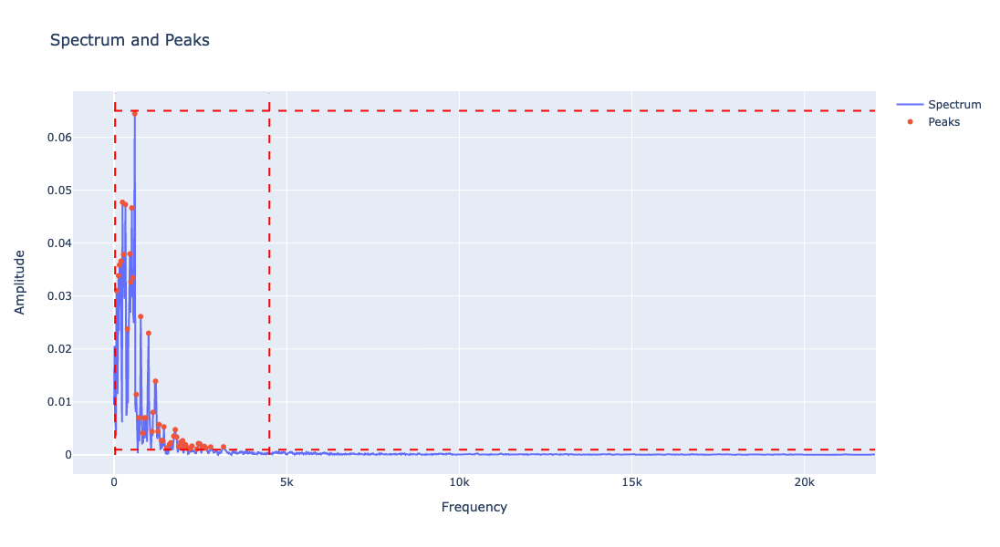

Analyzing chunk from 0.1s to 0.2s:
File name: chunk_0.1-0.2
Duration (s): 0.1
Sampling rate (Hz): 44100

Maximum amplitude value: 0.034028
Total number of bands: 2206
Frequency resolution (Hz): 10.0

Amplitude Threshold 1: 0.001
Amplitude Threshold 2: 0.065
Frequency Threshold 1 (Hz): 30
Frequency Threshold 2 (Hz): 4500

Peaks:


,Frequency (Hz),Amplitude
0,30.0,0.003875
1,80.0,0.012306
2,120.0,0.005445
3,160.0,0.002275
4,190.0,0.002638
5,210.0,0.003308
6,240.0,0.021715
7,280.0,0.003613
8,320.0,0.034028
9,370.0,0.004065


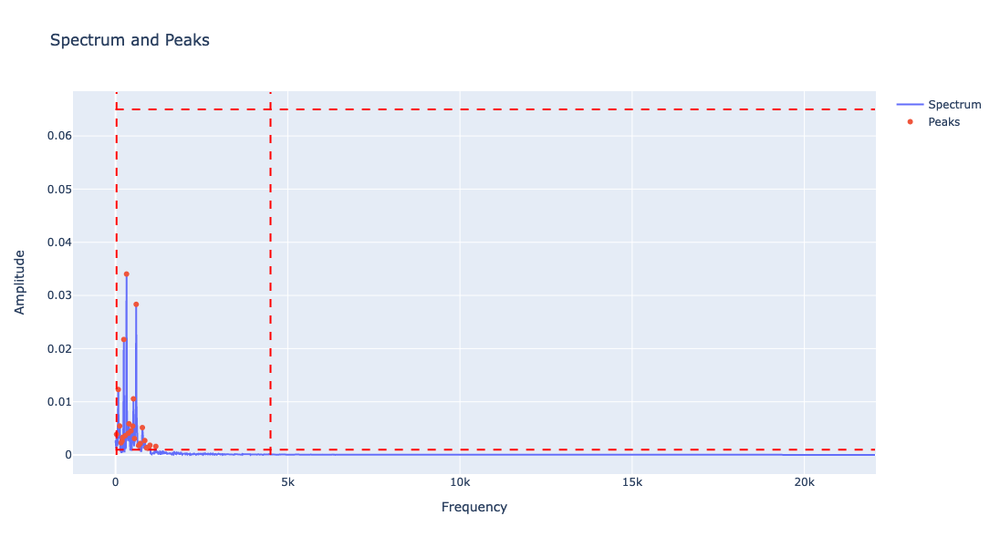

Analyzing chunk from 0.2s to 0.4s:
File name: chunk_0.2-0.4
Duration (s): 0.2
Sampling rate (Hz): 44100

Maximum amplitude value: 0.008233
Total number of bands: 4411
Frequency resolution (Hz): 5.0

Amplitude Threshold 1: 0.001
Amplitude Threshold 2: 0.065
Frequency Threshold 1 (Hz): 30
Frequency Threshold 2 (Hz): 4500

Peaks:


,Frequency (Hz),Amplitude
0,30.0,0.001384
1,75.0,0.001033
2,240.0,0.008233
3,280.0,0.001074
4,320.0,0.004678
5,395.0,0.003294
6,515.0,0.001382
7,550.0,0.001223
8,600.0,0.002793


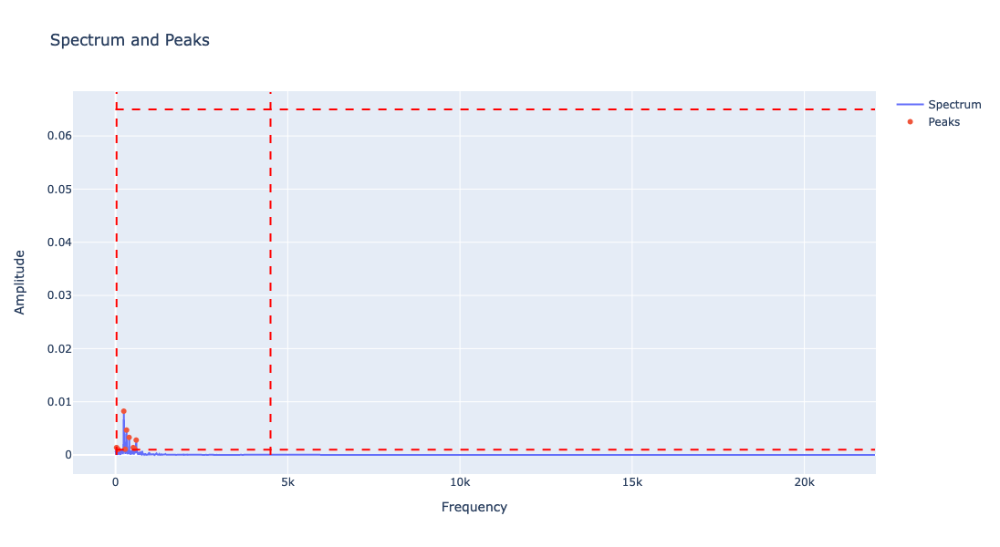

Analyzing chunk from 0.4s to 0.75s:
File name: chunk_0.4-0.75
Duration (s): 0.35
Sampling rate (Hz): 44100

Maximum amplitude value: 0.001412
Total number of bands: 7718
Frequency resolution (Hz): 2.857143

Amplitude Threshold 1: 0.001
Amplitude Threshold 2: 0.065
Frequency Threshold 1 (Hz): 30
Frequency Threshold 2 (Hz): 4500

Peaks:


,Frequency (Hz),Amplitude
0,240.0,0.001412


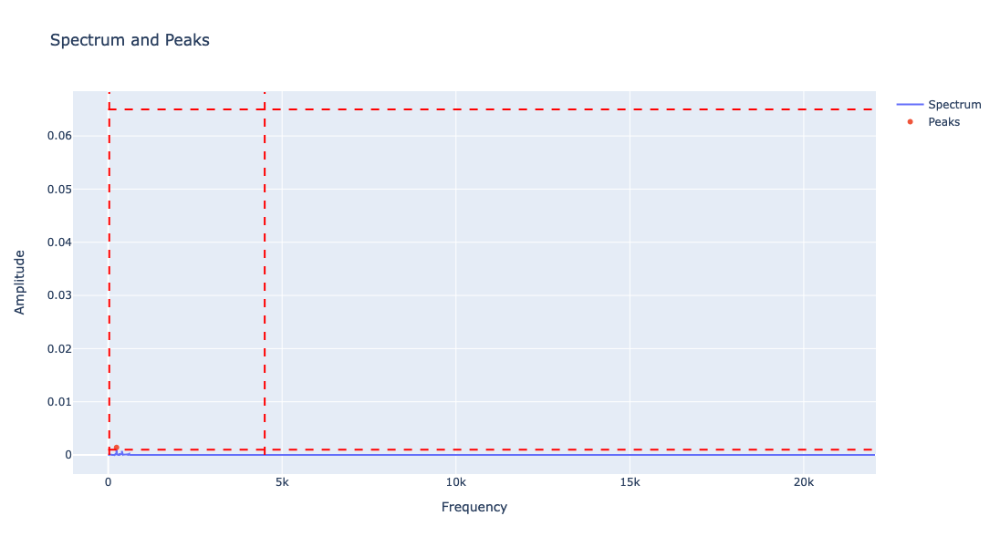

In [12]:
from py_scripts.dft_analysis import analyze_signal

# Define the time intervals for each chunk you want to analyze
time_intervals = [(0.03, 0.1), (0.1, 0.2), (0.2, 0.4), (0.4, 0.75)]  # add more intervals as needed
analysis_results = {}

# Analyze each specified time interval
for start_time, end_time in time_intervals:
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)
    chunk = cut_audio_data[start_sample:end_sample]
    print(f"Analyzing chunk from {start_time}s to {end_time}s:")
    peaks_df = analyze_signal(
        signal=chunk, 
        sr=sample_rate, 
        filename=f"chunk_{start_time}-{end_time}",
        window_type='boxcar', 
        thresh_amp_low=0.001, 
        thresh_amp_high=0.065, 
        thresh_freq_low=30, 
        thresh_freq_high=4500, 
        prominence=0.00005, 
        width=None,
        show_peaks=True, 
        show_plot=True
    )
    analysis_results[(start_time, end_time)] = peaks_df


In [9]:
analysis_results[(0.2, 0.4)]


,Frequency (Hz),Amplitude
0,30.0,0.001384
1,75.0,0.001033
2,240.0,0.008233
3,280.0,0.001074
4,320.0,0.004678
5,395.0,0.003294
6,515.0,0.001382
7,550.0,0.001223
8,600.0,0.002793


In [13]:
import pandas as pd

# Variables for amplitude processing
override_amp_value = None  # Set to a number to override all values within amp_min/amp_max, set to None to keep the rescaled values
scale_amp_value = True  # Set to True to scale amplitude values, False to keep original values

# Function to process DataFrame
def process_df(df):
    if scale_amp_value:
        amp_min_scaled = df['amp_min'] / df['amp_min'].max()
        amp_max_scaled = df['amp_max'] / df['amp_max'].max()
    else:
        amp_min_scaled = df['amp_min']
        amp_max_scaled = df['amp_max']
    
    if override_amp_value is not None:
        df['amp_min'] = override_amp_value
        df['amp_max'] = override_amp_value
    else:
        df['amp_min'] = amp_min_scaled
        df['amp_max'] = amp_max_scaled
        
    return df

combined_df = pd.DataFrame({
    'freq_start': [0],
    'freq_stop': [0],
    'time_start': [0],
    'time_stop': [0],
    'amp_min': [0],
    'amp_max': [0]
})

for (start_time, end_time), peaks_df in analysis_results.items():
    temp_df = pd.DataFrame({
        'freq_start': peaks_df['Frequency (Hz)'],
        'freq_stop': peaks_df['Frequency (Hz)'],
        'time_start': [start_time] * len(peaks_df),
        'time_stop': [end_time] * len(peaks_df),
        'amp_min': peaks_df['Amplitude'],
        'amp_max': peaks_df['Amplitude']
    })
    combined_df = pd.concat([combined_df, temp_df], ignore_index=True)

combined_df = process_df(combined_df)

combined_df


,freq_start,freq_stop,time_start,time_stop,amp_min,amp_max
0,0.000000,0.000000,0.00,0.00,0.000000,0.000000
1,71.428571,71.428571,0.03,0.10,0.481900,0.481900
2,128.571429,128.571429,0.03,0.10,0.525280,0.525280
3,157.142857,157.142857,0.03,0.10,0.556550,0.556550
4,200.000000,200.000000,0.03,0.10,0.567891,0.567891
...,...,...,...,...,...,...
83,395.000000,395.000000,0.20,0.40,0.051115,0.051115
84,515.000000,515.000000,0.20,0.40,0.021439,0.021439
85,550.000000,550.000000,0.20,0.40,0.018971,0.018971
86,600.000000,600.000000,0.20,0.40,0.043340,0.043340


In [14]:
import os
from datetime import datetime

# save the DataFrame as a TSV file
filename = 'tsv/conga_multidft2.tsv'
try:
    combined_df.to_csv(filename, sep='\t', index=False)
    print(f"Data saved successfully to {os.getcwd()}\\{filename} at {datetime.now()}.")
except:
    print("Error: data could not be saved.")

Data saved successfully to C:\Users\egorp\Nextcloud\code\audiospylt_beta\tsv/conga_multidft2.tsv at 2024-05-13 02:12:58.652886.
